In [1]:
import torch
import scanpy as sc

IOStream.flush timed out
/home/icb/yang.an/miniconda3/envs/mvTCR_rep/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import sys
sys.path.append('../mvTCR')
import tcr_embedding.utils_training as utils
from tcr_embedding.utils_preprocessing import group_shuffle_split

In [3]:
from matplotlib import rcParams
rcParams['figure.figsize'] = (12, 12)

%load_ext autoreload
%autoreload 2

In [4]:
random_seed = 42
utils.fix_seeds(random_seed)

# Load Data

In [5]:
adata = utils.load_data('borcherding')
adata.obs['Tissue+Type'] = [f'{tissue}.{type_}' for tissue, type_ in zip(adata.obs['Tissue'], adata.obs['Type'])]
metadata = ['Tissue', 'Type', 'Tissue+Type', 'functional.cluster', 'set', 'Cohort']

In [6]:
holdout_cohorts = ['GSE154826',  # Lung with normal and tumor cells 18387 cells
                   'GSE162500']  # Lung with 18850 cells

# maps each Cohort to the correct index used during training for the conditioning embedding
mapper = {'GSE123814': 0, 'GSE114724': 1, 'GSE139555': 2, 'GSE145370': 3,
          'GSE180268': 4, 'GSE176021': 5, 'GSE148190': 6, 'GSE159251': 7,
          'CCR-20-4394': 8, 'PRJNA705464': 9, 'GSE121636': 10, 'GSE154826': 11, 'GSE162500': 12}

In [7]:
# Add Cohort ID to adata and one-hot-encode
adata.obs['Cohort_id'] = adata.obs['Cohort'].map(mapper)
adata.obsm['Cohort'] = torch.nn.functional.one_hot(torch.tensor(adata.obs['Cohort_id'])).numpy()

In [8]:
# Create train-val split
adata.obs['set'] = 'train'
adata.obs['set'][adata.obs['Cohort'].isin(holdout_cohorts)] = 'hold_out'

In [9]:
# Used to load model correctly
adata_train = adata[~adata.obs['Cohort'].isin(holdout_cohorts)].copy()
adata_train.obsm['Cohort'] = torch.nn.functional.one_hot(torch.tensor(adata_train.obs['Cohort_id'])).numpy()

In [10]:
# Separate holdout data and create a validation set (20%) for early stopping
adata_hold_out = adata[adata.obs['set'] == 'hold_out'].copy()
train, val = group_shuffle_split(adata_hold_out, group_col='clonotype', val_split=0.2, random_seed=random_seed)
adata_hold_out.obs['set'] = 'train'
adata_hold_out.obs.loc[val.obs.index, 'set'] = 'val'

# With scArches

In [11]:
model = utils.load_model(adata_hold_out, f'../saved_models/journal/borcherding/scarches/borcherding_moe_scarches.pt')

In [12]:
%%time
latent_adata = model.get_latent(adata, metadata=metadata, return_mean=True)

CPU times: user 29min 1s, sys: 5.2 s, total: 29min 6s
Wall time: 1min 27s


In [13]:
latent_adata.obs['Cohort_held_out'] = latent_adata.obs['Cohort'].copy()
latent_adata.obs.loc[~latent_adata.obs['Cohort'].isin(holdout_cohorts), 'Cohort_held_out'] = None

In [14]:
%%time
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata, min_dist=0.5, spread=1.0)

CPU times: user 17min 39s, sys: 3min, total: 20min 40s
Wall time: 13min 4s


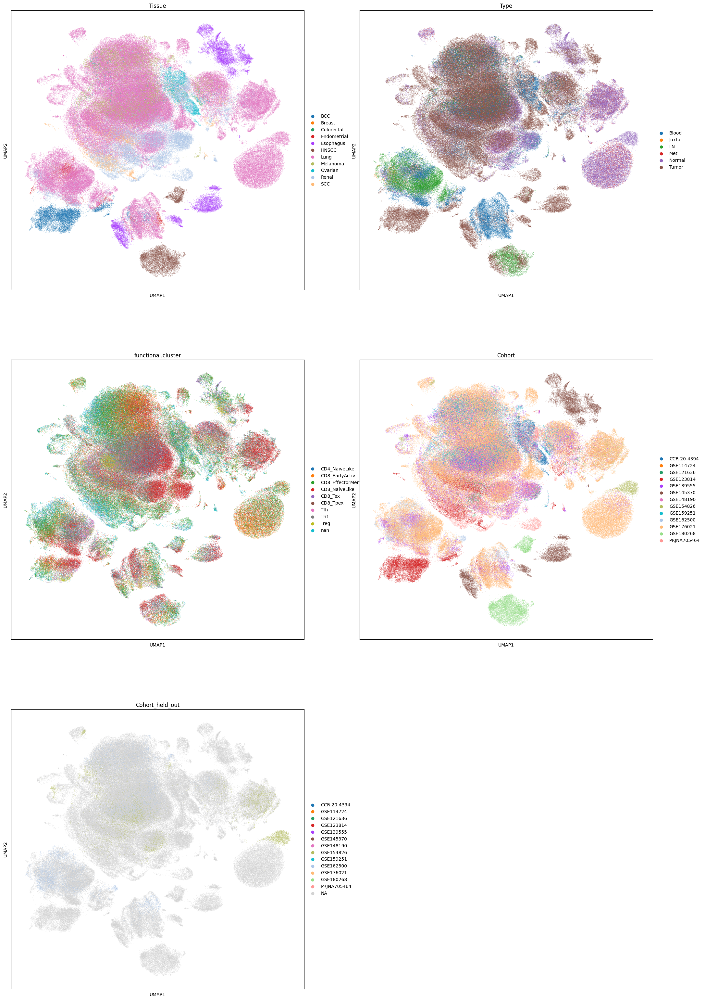

In [15]:
sc.pl.umap(latent_adata, color=['Tissue', 'Type', 'functional.cluster', 'Cohort', 'Cohort_held_out'], size=1, ncols=2)#, save=f'_borcherding_moe_set.png')

In [16]:
latent_adata.write_h5ad(f'../data/borcherding_moe_scarches.h5ad', compression='gzip')

# Without scArches

In [17]:
model = utils.load_model(adata_hold_out, f'../saved_models/journal/borcherding/scarches/borcherding_moe_baseline.pt')

In [18]:
%%time
latent_adata = model.get_latent(adata, metadata=metadata, return_mean=True)

CPU times: user 38.1 s, sys: 7.19 s, total: 45.3 s
Wall time: 37.8 s


In [19]:
latent_adata.obs['Cohort_held_out'] = latent_adata.obs['Cohort'].copy()
latent_adata.obs.loc[~latent_adata.obs['Cohort'].isin(holdout_cohorts), 'Cohort_held_out'] = None

In [20]:
%%time
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata, min_dist=1.0, spread=0.5)

CPU times: user 18min 52s, sys: 2min 37s, total: 21min 30s
Wall time: 10min 38s


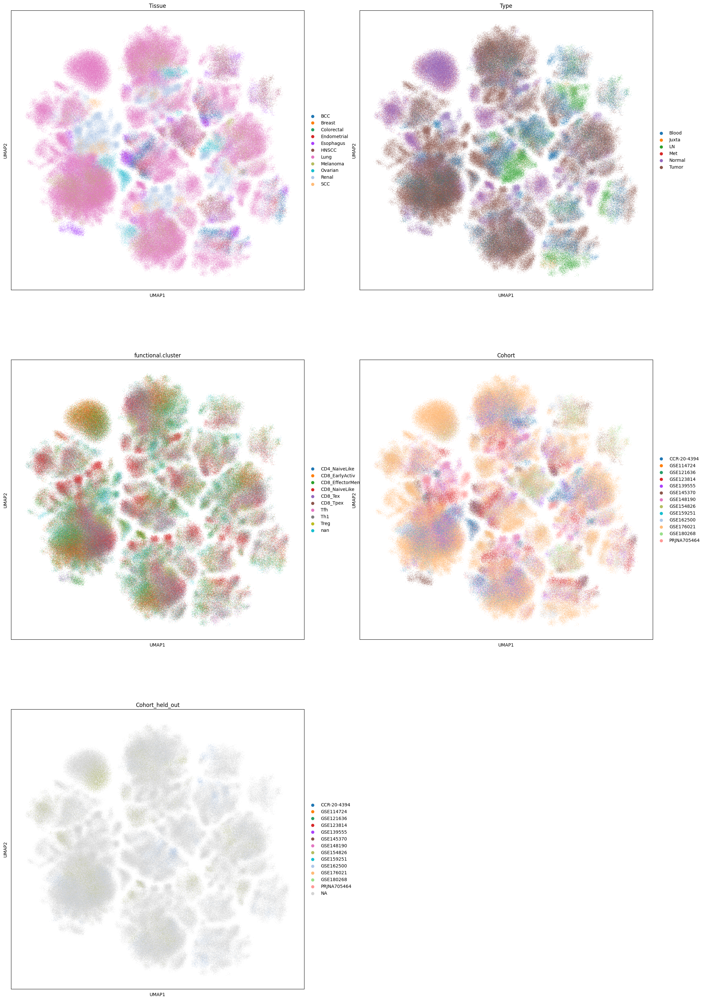

In [21]:
sc.pl.umap(latent_adata, color=['Tissue', 'Type', 'functional.cluster', 'Cohort', 'Cohort_held_out'], size=1, ncols=2)#, save=f'_borcherding_moe_set.png')

In [22]:
latent_adata.write_h5ad(f'../data/borcherding_moe_baseline.h5ad', compression='gzip')